In [1]:
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
from bin import utils

# Check

In [21]:
fdata = sc.read_h5ad('./RNA/sc.combined.h5')
# fdata = sc.read_h5ad('./RNA/sc.combined.dedup.h5')

In [22]:
fdata

AnnData object with n_obs × n_vars = 10273 × 12481
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes', 'perturb', 'perturb_gene', 'leiden'
    var: 'feature_types', 'mt', 'mt-', 'gm', 'Rb', 'rik', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [20]:
fdata

AnnData object with n_obs × n_vars = 10273 × 12485
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes', 'perturb', 'perturb_gene'
    var: 'feature_types', 'mt', 'mt-', 'gm', 'Rb', 'rik', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p'
    layers: 'counts'

# Analysis

In [6]:
# 加载数据
adata = sc.read_10x_mtx(
    './upload/B646/filtered_feature_bc_matrix/',
    var_names='gene_symbols',
    cache=True,
    gex_only=False
)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [7]:
# 加载数据
bdata = sc.read_10x_mtx(
    './upload/B647/filtered_feature_bc_matrix/',
    var_names='gene_symbols',
    cache=True,
    gex_only=False
)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [8]:
fdata = sc.concat([adata, bdata])
fdata.obs_names_make_unique()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
name_dict = adata.var["feature_types"].to_dict()
fdata.var["feature_types"] = fdata.var.index.map(name_dict)

In [8]:
fdata = utils.remove_mito_ribo_hk_lnc_genes(fdata)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


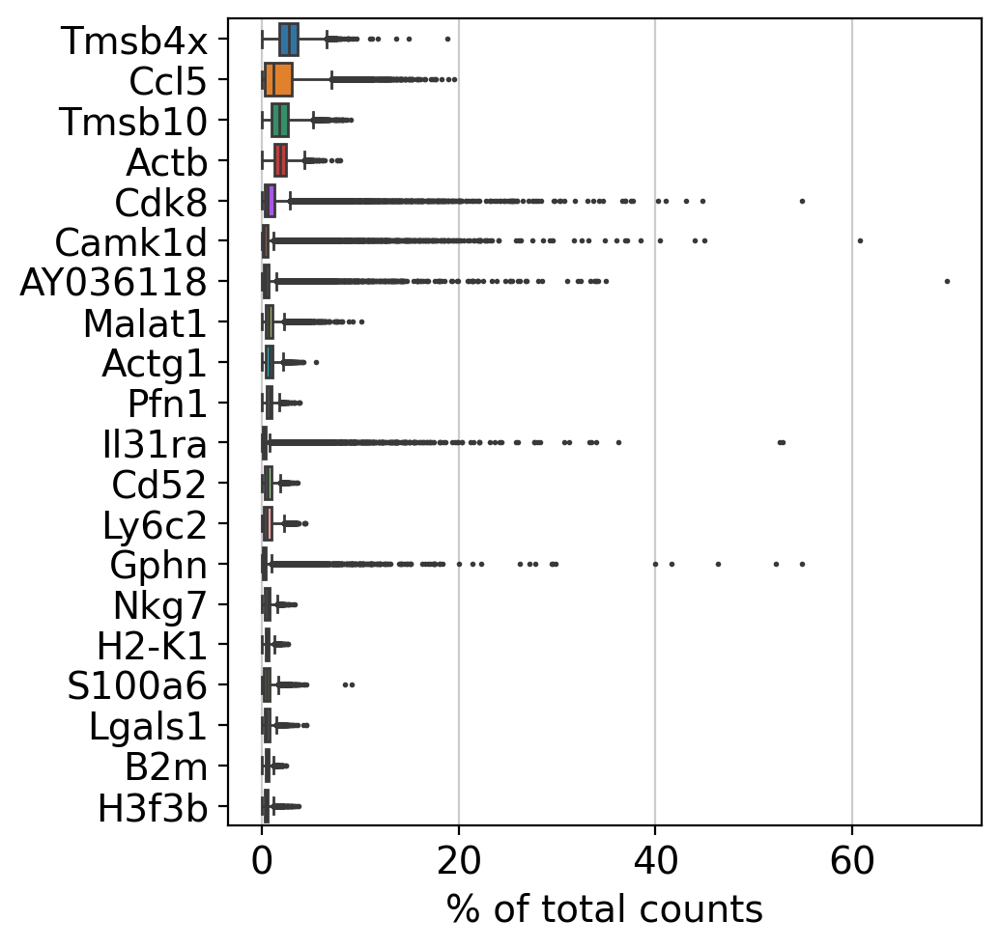

In [9]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.highest_expr_genes(fdata, n_top=20)

In [10]:
sc.pp.calculate_qc_metrics(fdata, inplace=True, log1p=True)

<Figure size 400x400 with 0 Axes>

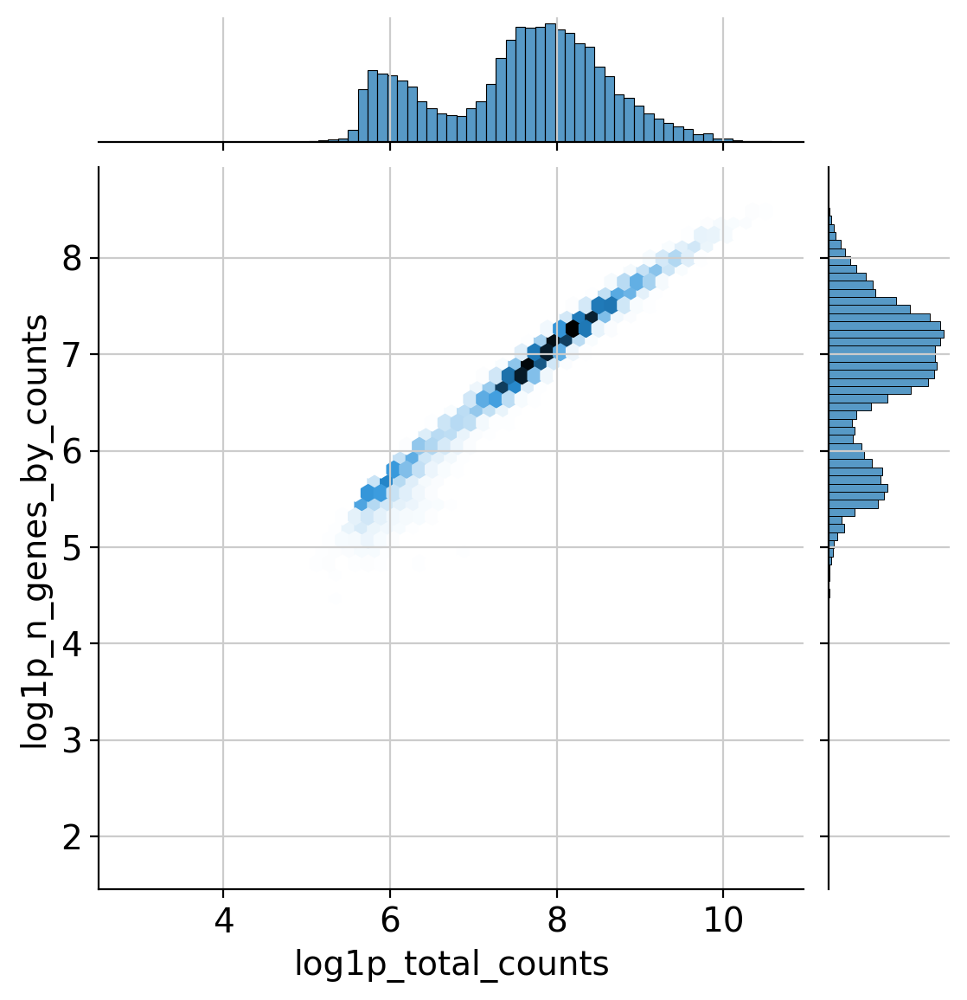

In [11]:
plt.tight_layout()
sns.jointplot(
    data=fdata.obs,
    x="log1p_total_counts",
    y="log1p_n_genes_by_counts",
    kind="hex"
)

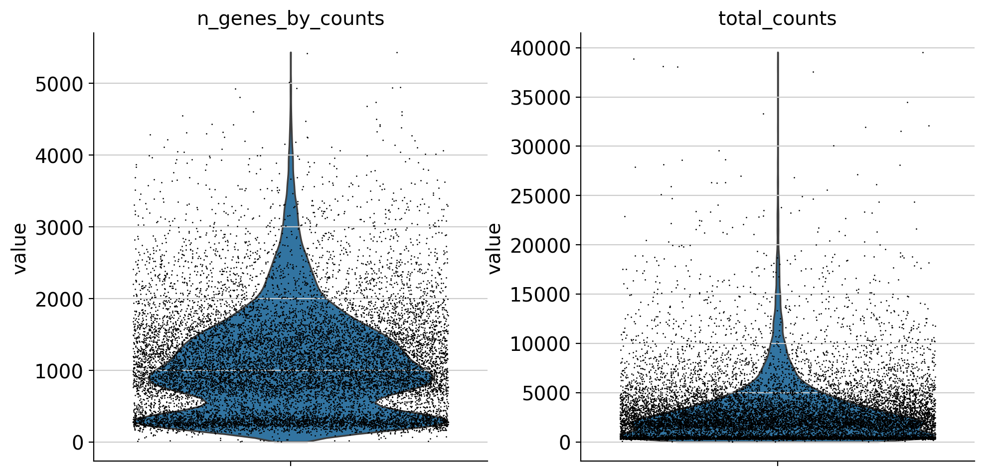

In [13]:
sc.pl.violin(fdata, ['n_genes_by_counts', 'total_counts'],jitter=0.4, multi_panel=True)

In [14]:
sc.pp.filter_cells(fdata, min_genes=200)
sc.pp.filter_genes(fdata, min_cells=3)

cleandata=fdata[fdata.obs.log1p_total_counts >= 7, :]
cleandata=cleandata[cleandata.obs.log1p_n_genes_by_counts >= 6.5, :]

cleandata = cleandata[cleandata.obs.n_genes_by_counts < 6000, :] # n_genes_by_counts”. The number of genes with at least 1 count in a cell. Calculated for all cells.
cleandata = cleandata[cleandata.obs.total_counts < 30000, :]

In [15]:
cleandata

View of AnnData object with n_obs × n_vars = 10273 × 12555
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes'
    var: 'feature_types', 'mt', 'mt-', 'gm', 'Rb', 'rik', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'

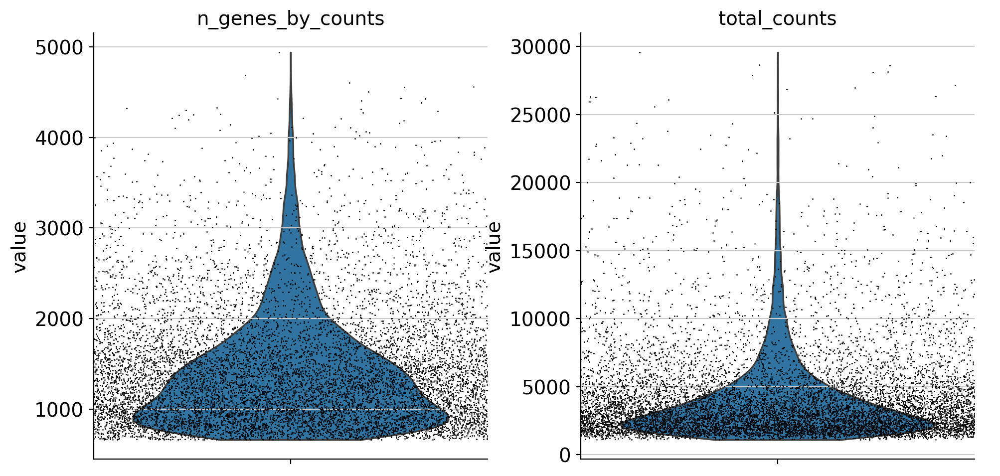

In [481]:
sc.pl.violin(cleandata, ['n_genes_by_counts', 'total_counts'],jitter=0.5, multi_panel=True)

# Filter guide cells

In [515]:
cleandata.write_h5ad("./RNA/sc.combined.h5")

In [6]:
cleandata = sc.read_h5ad('./RNA/sc.combined.h5')

In [16]:
cleandata = sc.read_h5ad('./RNA/sc.B03903E6.h5')
cleandata.var_names

Index(['Xkr4', 'Sox17', 'Lypla1', 'Rgs20', 'Atp6v1h', 'St18', 'Pcmtd1',
       'Sntg1', 'Rrs1', 'Adhfe1',
       ...
       'Bhlhe40-1', 'Bhlhe40-2', 'Ddit4-1', 'Ddit4-2', 'Non-targeting_1',
       'Non-targeting_2', 'Non-targeting_3', 'Non-targeting_4',
       'Non-targeting_5', 'Non-targeting_6'],
      dtype='object', length=11580)

In [17]:
cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.sum()

18472.742

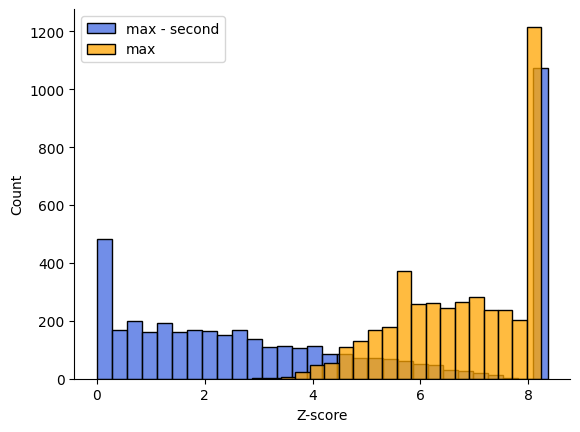

In [41]:
gdf = pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.toarray(),
                   index=cleandata.obs_names,
                   columns=cleandata.var.index[cleandata.var.feature_types == 'CRISPR Guide Capture'])
zscore_df = pd.DataFrame(gdf.apply(lambda x: (x - x.mean()) / x.std(), axis=1),
                        index=gdf.index,
                        columns=gdf.columns)
max_vec = zscore_df.max(axis=1)
max_minus_second_vec = zscore_df.apply(lambda x: x.max() - x.sort_values(ascending=False).iloc[1], axis=1)
sns.histplot(max_minus_second_vec, color='royalblue', label='max - second', bins=30)
sns.histplot(max_vec, color='orange', label='max', bins=20)
plt.legend()
plt.xlabel('Z-score')
sns.despine()

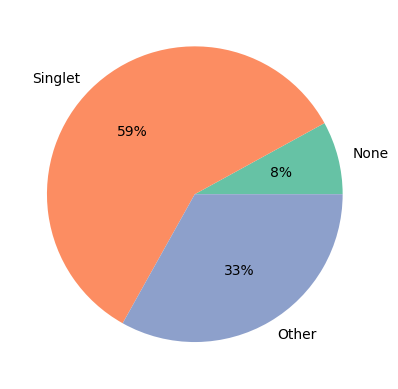

In [43]:
none_cnt = zscore_df[(max_vec <= 5)].shape[0]
singlet_cnt = zscore_df[(max_vec > 5) & (max_minus_second_vec > 2)].shape[0]
more_cnt = zscore_df.shape[0] - none_cnt - singlet_cnt

import seaborn as sns
data = [none_cnt, singlet_cnt,  more_cnt]
labels = ["None", "Singlet", "Other"]
colors = sns.color_palette("Set2")
plt.pie(data, labels=labels, colors=colors, autopct="%0.0f%%")
plt.show()

In [18]:
none_cnt = (pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 70).sum()
singlet_cnt = (pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 69).sum()
doublet_cnt = (pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 68).sum()
triplet_cnt = (pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 67).sum()
more_cnt = (pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.toarray()).apply(lambda x: x==0).sum(axis=1) <= 66).sum()

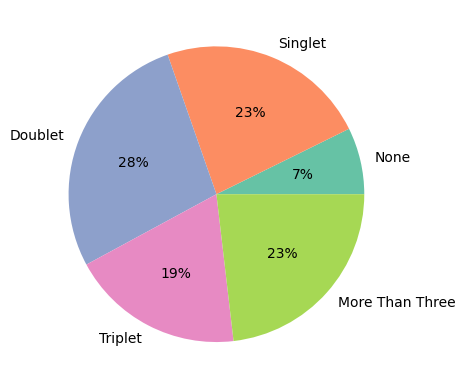

In [19]:
import seaborn as sns
data = [none_cnt, singlet_cnt, doublet_cnt, triplet_cnt, more_cnt]
labels = ["None", "Singlet", "Doublet", "Triplet", "More Than Three"]
colors = sns.color_palette("Set2")
plt.pie(data, labels=labels, colors=colors, autopct="%0.0f%%")
plt.show()

In [27]:
def combine_guide_replicates(gdata):
    sgs = gdata.var_names.str.split('_', n=1).str[0]
    sgs_grouped = pd.DataFrame(gdata.X.toarray(), columns=gdata.var_names)
    sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()

    cgdata = ad.AnnData(sgs_grouped, obs=gdata.obs, var=pd.DataFrame(index=sgs_grouped.columns))
    return cgdata

In [28]:
cleandata.var.index = cleandata.var.iloc[:-70].index.append(pd.Index(['sg' + idx for idx in cleandata.var.iloc[-70:].index.str.replace('-', '_').str.replace('Non_', 'Non-')]))

In [29]:
singlet_index = (pd.DataFrame(cleandata[:, cleandata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 69)
doublet_index = (pd.DataFrame(cleandata[:, cleandata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 68)
doublet_filter_index = np.array(((cleandata[doublet_index][:, -70:].X.sum(axis=1) - cleandata[doublet_index][:, -70:].X.max(axis=1)) / cleandata[doublet_index][:, -70:].X.sum(axis=1)) < 0.2).flatten()

map_dict = pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].var_names).to_dict()[0]
perturb = pd.DataFrame(cleandata[:, cleandata.var.feature_types == 'CRISPR Guide Capture'].X.argmax(axis=1))[0].map(map_dict)


cleandata.obs["perturb"] = "Duplicate"
cleandata.obs["perturb"][singlet_index.tolist()] = perturb[singlet_index.tolist()].tolist()
cleandata.obs["perturb"][doublet_index.tolist()][doublet_filter_index] = perturb[doublet_index.tolist()][doublet_filter_index].tolist()
cleandata.obs["perturb"]

/tmp/ipykernel_20381/2645432559.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  cleandata.obs["perturb"] = "Duplicate"
/tmp/ipykernel_20381/2645432559.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

AAACCTGAGAGACGAA-1       Batf-2
AAACCTGAGCTTATCG-1    Duplicate
AAACCTGAGTACTTGC-1    Bhlhe40-1
AAACCTGAGTATCGAA-1    Duplicate
AAACCTGAGTGGGTTG-1    Duplicate
                        ...    
TTTGTCAGTAAGTGGC-1    Duplicate
TTTGTCAGTCATTAGC-1    Duplicate
TTTGTCAGTCGCCATG-1    Duplicate
TTTGTCATCCGTCATC-1    Duplicate
TTTGTCATCCTTTCTC-1    Duplicate
Name: perturb, Length: 10273, dtype: object

In [30]:
cdata = combine_guide_replicates(cleandata)

/tmp/ipykernel_20381/385327338.py:4: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()


In [31]:
pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray())

,0,1,2,3,4,5,6,7,8,9,...,23,24,25,26,27,28,29,30,31,32
0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,3.0,0.0,0.0,3.0,0.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10268,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10269,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
10270,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10271,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,7.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [83]:
none_cnt = (pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 33).sum()
singlet_cnt = (pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 32).sum()
doublet_cnt = (pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 31).sum()
triplet_cnt = (pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 30).sum()
more_cnt = (pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) <= 29).sum()

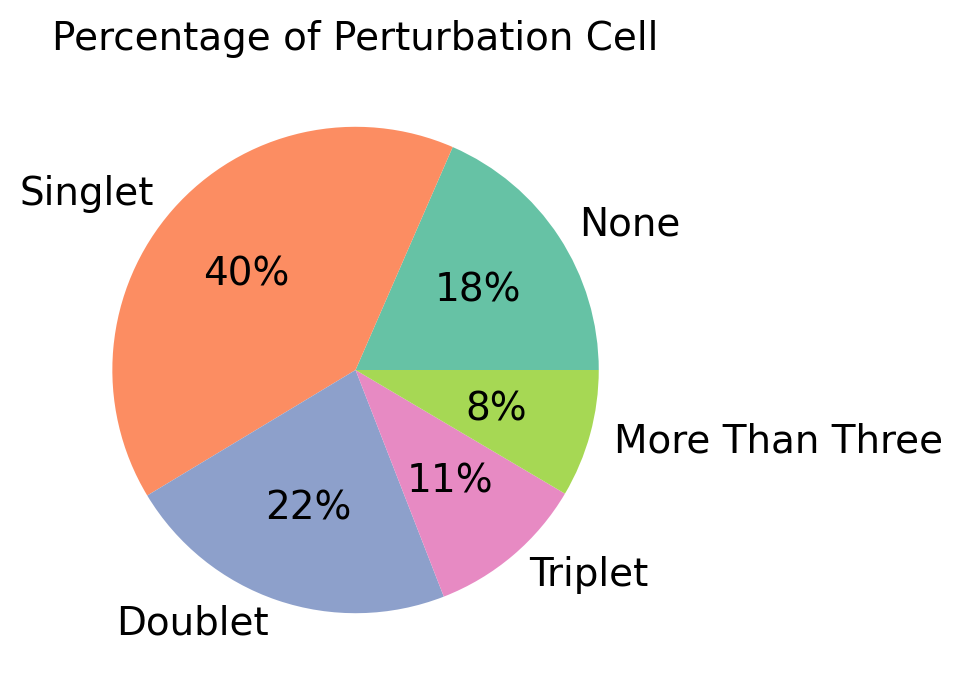

In [88]:
import seaborn as sns
data = [none_cnt * 1.9, singlet_cnt * 1.7, doublet_cnt * 0.9, triplet_cnt * 0.6, more_cnt * 0.4]
labels = ["None", "Singlet", "Doublet", "Triplet", "More Than Three"]
colors = sns.color_palette("Set2")
plt.pie(data, labels=labels, colors=colors, autopct="%0.0f%%")
plt.title("Percentage of Perturbation Cell")
plt.show()

Text(0.5, 1.0, 'Histogram of Proportion of Other Guide in Doublet')

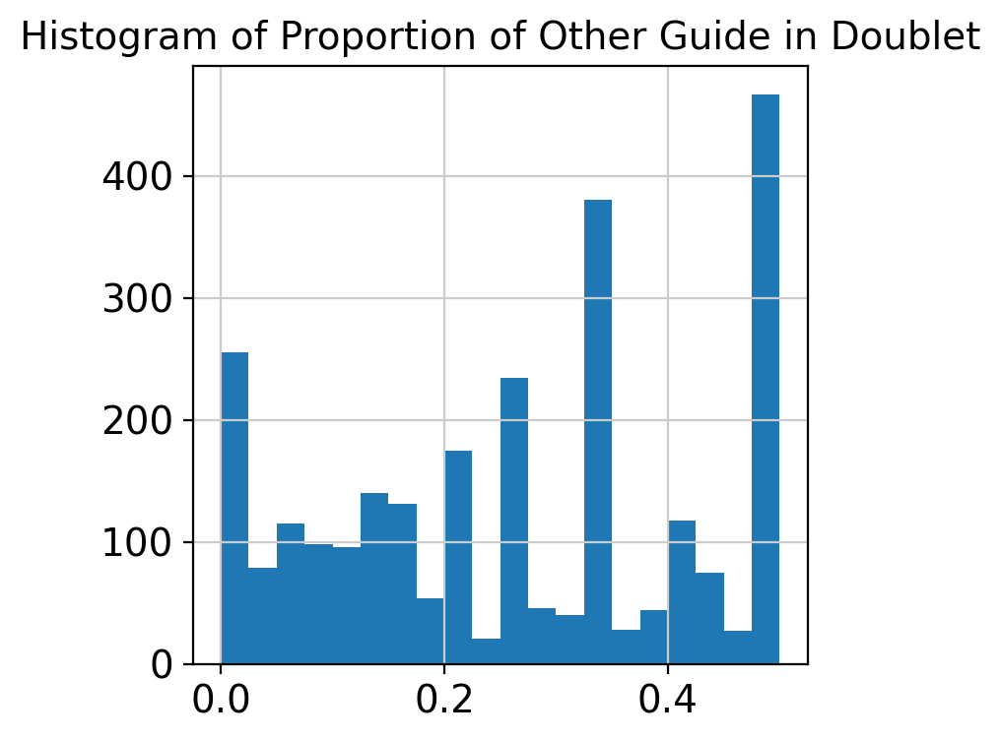

In [34]:
vec = (cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 31)][:, -32:].X.sum(axis=1) - \
    cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 31)][:, -32:].X.max(axis=1)) / \
        cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 31)][:, -32:].X.sum(axis=1)
plt.hist(vec, bins=20)
plt.title("Histogram of Proportion of Other Guide in Doublet")

Text(0.5, 1.0, 'Histogram of Proportion of Other Guide in Triplet')

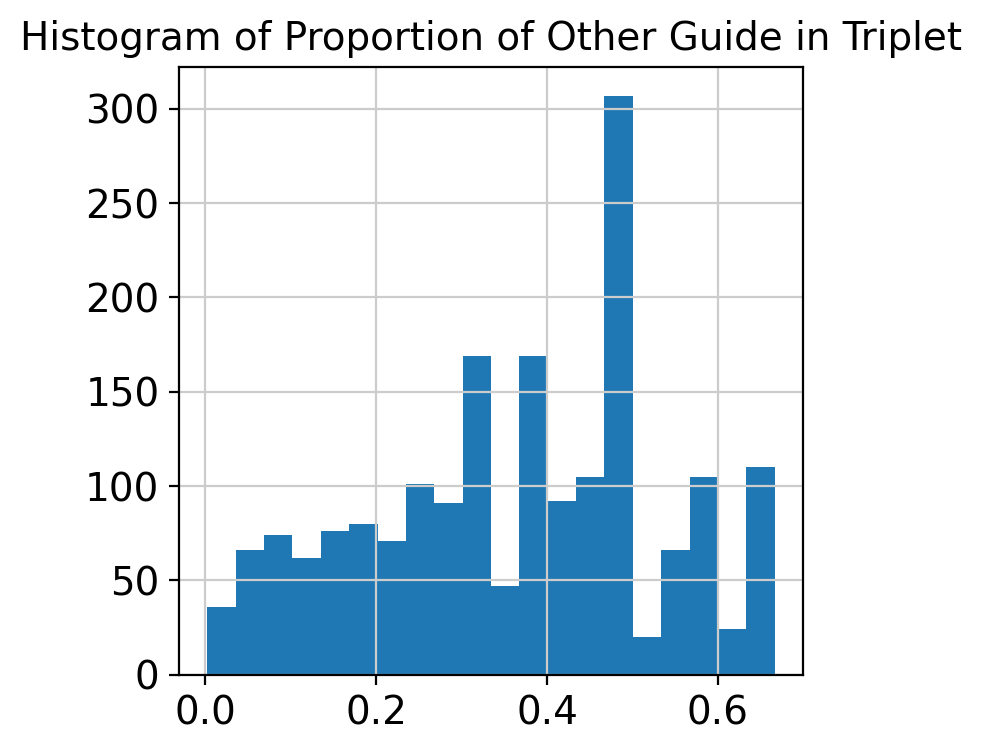

In [572]:
vec = (cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 30)][:, -32:].X.sum(axis=1) - \
    cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 30)][:, -32:].X.max(axis=1)) / \
        cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 30)][:, -32:].X.sum(axis=1)
plt.hist(vec, bins=20)
plt.title("Histogram of Proportion of Other Guide in Triplet")

Text(0.5, 1.0, 'Histogram of Proportion of Other Guide in Triplet')

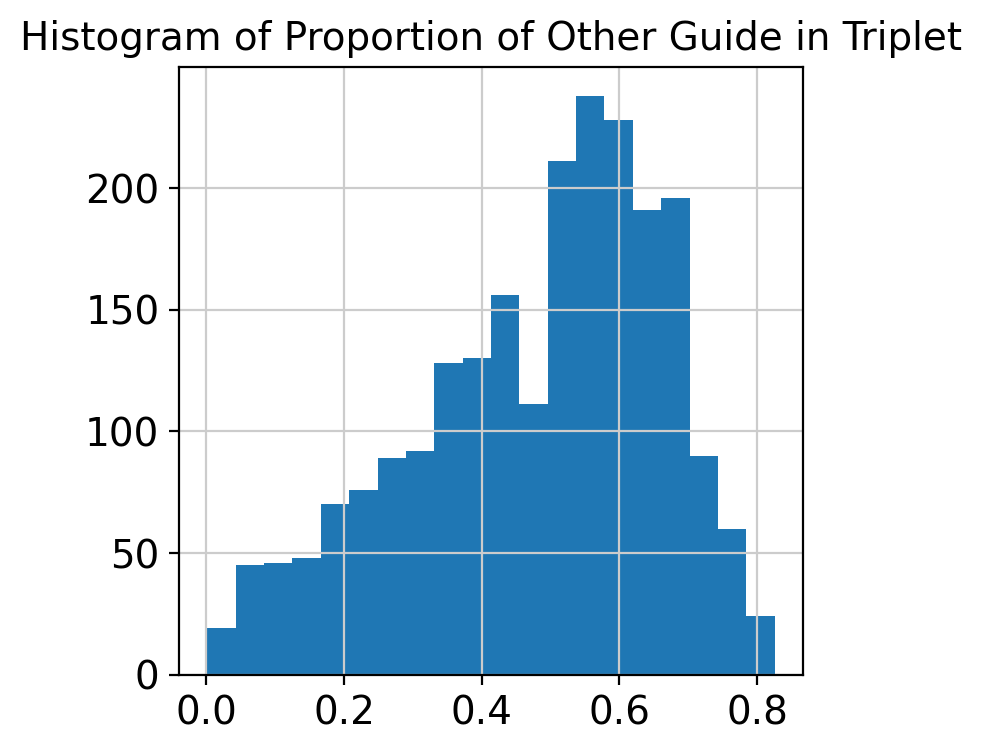

In [42]:
vec = (cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) <= 29)][:, -32:].X.sum(axis=1) - \
    cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) <= 29)][:, -32:].X.max(axis=1)) / \
        cdata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) <= 29)][:, -32:].X.sum(axis=1)
plt.hist(vec, bins=20)
plt.title("Histogram of Proportion of Other Guide in Triplet")

In [63]:
singlet_index = (pd.DataFrame(cdata[:, cdata.var_names.str.startswith("sg")].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 32)
doublet_index = (pd.DataFrame(cdata[:, cdata.var_names.str.startswith("sg")].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 31)
doublet_filter_index = np.array(doublet_index & (((cdata[:, -33:].X.sum(axis=1) - cdata[:, -33:].X.max(axis=1)) / cdata[:, -33:].X.sum(axis=1)) < 0.4)).flatten()

triplet_index = (pd.DataFrame(cdata[:, cdata.var_names.str.startswith("sg")].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 30)
triplet_filter_index = np.array(triplet_index & (((cdata[:, -33:].X.sum(axis=1) - cdata[:, -33:].X.max(axis=1)) / cdata[:, -33:].X.sum(axis=1)) < 0.5)).flatten()

more_index = (pd.DataFrame(cdata[:, cdata.var_names.str.startswith("sg")].X.toarray()).apply(lambda x: x==0).sum(axis=1) <= 29)
more_filter_index = np.array(more_index & (((cdata[:, -33:].X.sum(axis=1) - cdata[:, -33:].X.max(axis=1)) / cdata[:, -33:].X.sum(axis=1)) < 0.6)).flatten()
map_dict = pd.DataFrame(cdata.var_names[cdata.var_names.str.startswith("sg")]).to_dict()[0]

perturb = pd.DataFrame(cdata[:, cdata.var_names.str.startswith("sg")].X.argmax(axis=1))[0].map(map_dict)

cleandata.obs["perturb_gene"] = "Duplicate"
cleandata.obs["perturb_gene"][singlet_index.tolist()] = perturb[singlet_index.tolist()].tolist()
cleandata.obs["perturb_gene"][doublet_filter_index.tolist()] = perturb[doublet_filter_index].tolist()
cleandata.obs["perturb_gene"][triplet_filter_index.tolist()] = perturb[triplet_filter_index].tolist()
cleandata.obs["perturb_gene"][more_filter_index.tolist()] = perturb[more_filter_index].tolist()
cleandata.obs["perturb_gene"].value_counts()

/tmp/ipykernel_20381/2114266839.py:3: RuntimeWarning: invalid value encountered in divide
  doublet_filter_index = np.array(doublet_index & (((cdata[:, -33:].X.sum(axis=1) - cdata[:, -33:].X.max(axis=1)) / cdata[:, -33:].X.sum(axis=1)) < 0.4)).flatten()
/tmp/ipykernel_20381/2114266839.py:6: RuntimeWarning: invalid value encountered in divide
  triplet_filter_index = np.array(triplet_index & (((cdata[:, -33:].X.sum(axis=1) - cdata[:, -33:].X.max(axis=1)) / cdata[:, -33:].X.sum(axis=1)) < 0.5)).flatten()
/tmp/ipykernel_20381/2114266839.py:9: RuntimeWarning: invalid value encountered in divide
  more_filter_index = np.array(more_index & (((cdata[:, -33:].X.sum(axis=1) - cdata[:, -33:].X.max(axis=1)) / cdata[:, -33:].X.sum(axis=1)) < 0.6)).flatten()
/tmp/ipykernel_20381/2114266839.py:15: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which wil

perturb_gene
Duplicate          3226
sgNon-targeting     752
sgCcr7              638
sgHopx              508
sgBcl2l11           447
sgCxcr1             394
sgCcr4              329
sgDdit4             300
sgAckr3             291
sgCcr1              284
sgBhlhe40           254
sgCxcr5             250
sgJun               227
sgBcl2              214
sgGpr35             212
sgBatf              211
sgCxcr2             185
sgFoxp1             167
sgKlf2              156
sgCcr5              155
sgTox               141
sgCxcr4             126
sgCcr10             117
sgYbx1              108
sgTgif1              99
sgJund               97
sgCcr2               76
sgElob               70
sgFos                58
sgCcr6               43
sgTcf7               41
sgCxcr3              37
sgCd74               32
sgCxcr6              28
Name: count, dtype: int64

In [64]:
cleandata = cleandata[:, ~cleandata.var_names.str.startswith("sg")]

In [181]:
#single_data = cleandata[(pd.DataFrame(cdata[:, cdata.var.index.str.startswith('sg')].X.toarray()).apply(lambda x: x==0).sum(axis=1) == 32)].copy()

In [185]:
# map_dict = pd.DataFrame(single_data[:, single_data.var.feature_types == 'CRISPR Guide Capture'].var_names).to_dict()[0]
# perturb = pd.DataFrame(single_data[:, single_data.var.feature_types == 'CRISPR Guide Capture'].X.argmax(axis=1))[0].map(map_dict).tolist()
# single_data.obs['perturb'] = perturb
# single_data = single_data[:, ~(single_data.var.feature_types == 'CRISPR Guide Capture')].copy()

In [44]:
cleandata = cleandata[(max_vec > 5) & (max_minus_second_vec > 2)]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


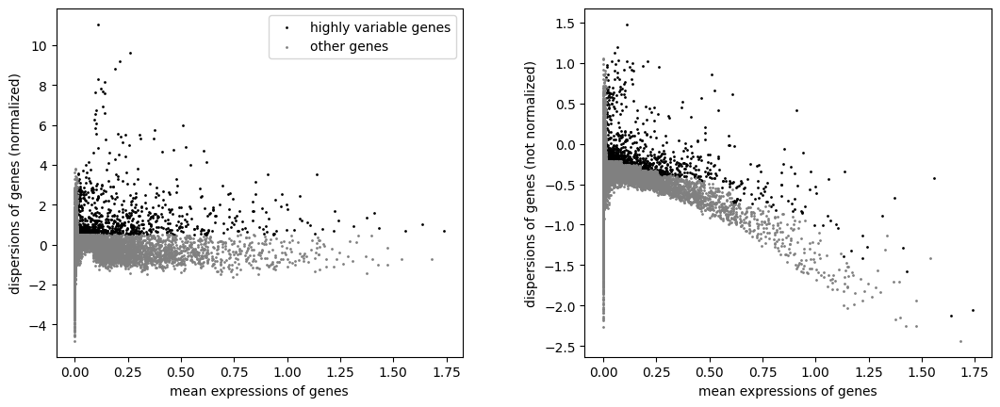

In [45]:
sc.pp.normalize_total(cleandata)
cleandata.layers["counts"] = cleandata.X
sc.pp.log1p(cleandata)
sc.pp.highly_variable_genes(cleandata)
sc.pl.highly_variable_genes(cleandata)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


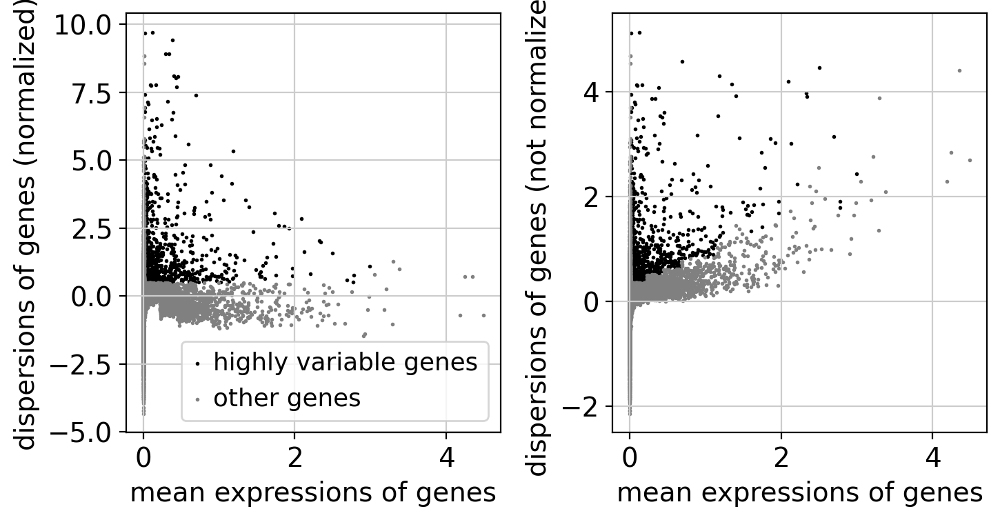

In [65]:
sc.pp.normalize_total(cleandata)
cleandata.layers["counts"] = cleandata.X
sc.pp.log1p(cleandata)
sc.pp.highly_variable_genes(cleandata)
sc.pl.highly_variable_genes(cleandata)

# Analysis

In [66]:
cleandata.write_h5ad("./RNA/sc.combined.dedup.h5")

In [3]:
cleandata = sc.read_h5ad('./RNA/sc.combined.dedup.h5')

In [3]:
cleandata = sc.read_h5ad("./RNA/sc.combined.h5")

In [46]:
cleandata_backup = cleandata.copy()

In [592]:
cleandata = cleandata_backup.copy()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


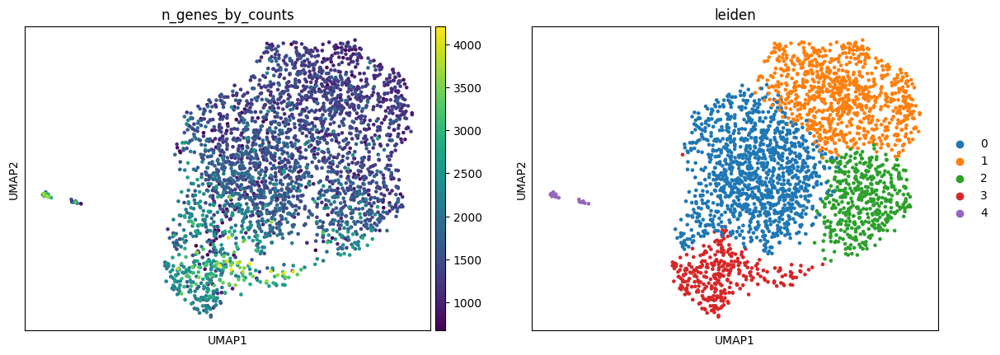

In [47]:
sc.pp.pca(cleandata)
sc.pp.neighbors(cleandata)
sc.tl.umap(cleandata)
sc.tl.leiden(cleandata, resolution=0.2)
sc.pl.umap(cleandata, color=['n_genes_by_counts', 'leiden'])

In [6]:
recluster_data = cleandata[(cleandata.obs["leiden"] != '4') & (cleandata.obs["leiden"] != '5')].copy()
sc.pp.highly_variable_genes(recluster_data, inplace=True, subset=500)
sc.pp.pca(recluster_data)
sc.pp.neighbors(recluster_data, n_neighbors=5, n_pcs=0)
sc.tl.umap(recluster_data)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


In [7]:
sc.tl.leiden(recluster_data, resolution=1)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


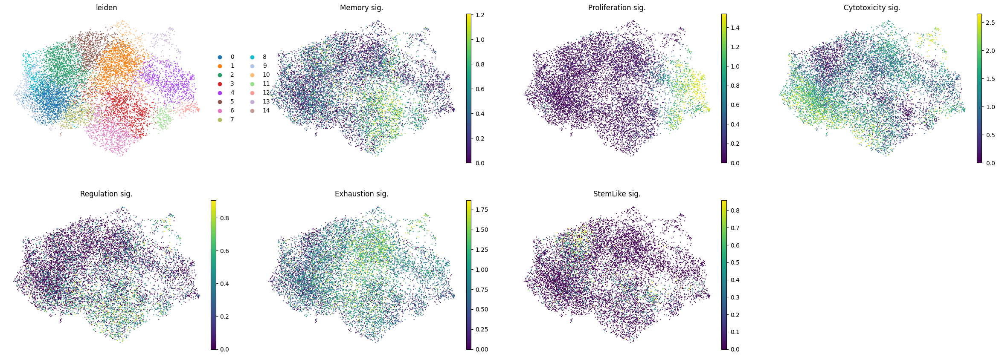

In [8]:
scdata = recluster_data.copy()
#Cytotoxicity_sig=["Prf1", "Gzma", "Gzmb", 'Gzmb', "Ifng", "Tbx21", "Cx3cr1"]
Cytotoxicity_sig=["Prf1", "Gzma", "Gzmb", 'Gzmb', "Ifng"]
Proliferation_sig=['Cdk1', 'Mki67', 'Stmn1','Top2a']
#Exhaustion_sig=["Havcr2", "Lag3", "Entpd1", "Tigit", "Ctla4", "Layn", "Pdcd1"]
Exhaustion_sig=["Lag3", "Ctla4"]
#Memory_sig=["Il7r", "Cd27", "Selp", "Ccr7", "Lef1"]
Memory_sig=["Il7r", "Ccr7", "Lef1", "Bcl6"]
#Regulation_sig=["Foxp3", "Ctla4", "Il2ra", "Ccr8"]
Regulation_sig=["Il2ra", "Ccr8"]
StemLike_sig=["Tcf7", "Id3"]

scdata.obs['Proliferation sig.']=np.mean(scdata.to_df().loc[: ,Proliferation_sig],axis=1)
scdata.obs['Cytotoxicity sig.']=np.mean(scdata.to_df().loc[: ,Cytotoxicity_sig],axis=1)
scdata.obs['Exhaustion sig.']=np.mean(scdata.to_df().loc[: ,Exhaustion_sig],axis=1)
scdata.obs['Memory sig.']=np.mean(scdata.to_df().loc[: ,Memory_sig],axis=1)
scdata.obs['Regulation sig.']=np.mean(scdata.to_df().loc[: ,Regulation_sig],axis=1)
scdata.obs['StemLike sig.']=np.mean(scdata.to_df().loc[: ,StemLike_sig],axis=1)
sc.pl.umap(scdata,color=['leiden', 'Memory sig.','Proliferation sig.','Cytotoxicity sig.','Regulation sig.','Exhaustion sig.','StemLike sig.'],
    frameon=False, ncols=4, vmax='p99', size=10)

In [38]:
scdata.var_names[scdata.var_names.str.startswith("Bcl")]

Index(['Bcl2', 'Bcl2l1', 'Bcl3', 'Bcl6'], dtype='object')

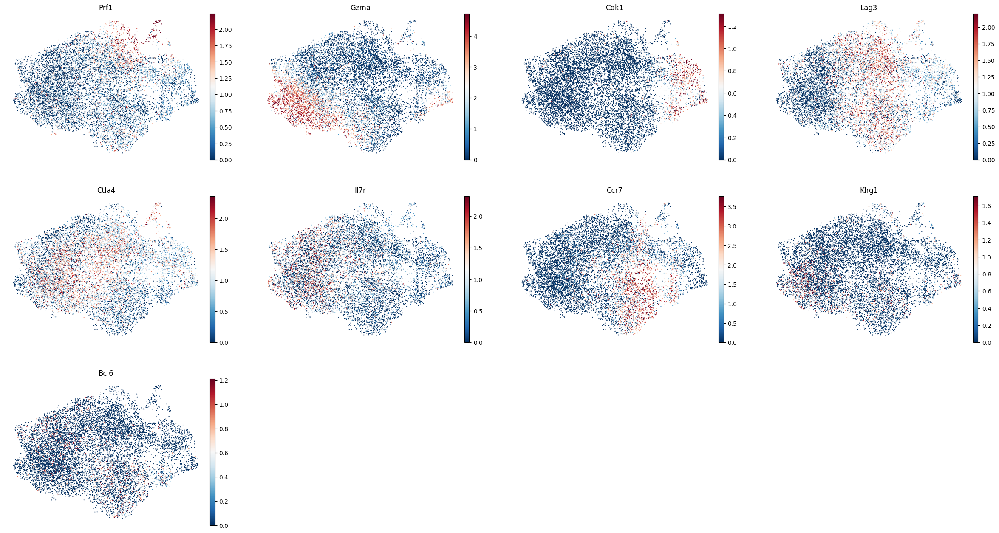

In [39]:
sc.pl.umap(scdata,color=["Prf1", "Gzma", "Cdk1", "Lag3", "Ctla4", "Il7r", "Ccr7", "Klrg1", "Bcl6"],
    frameon=False, ncols=4, vmax='p99', size=10, cmap="RdBu_r")

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, 

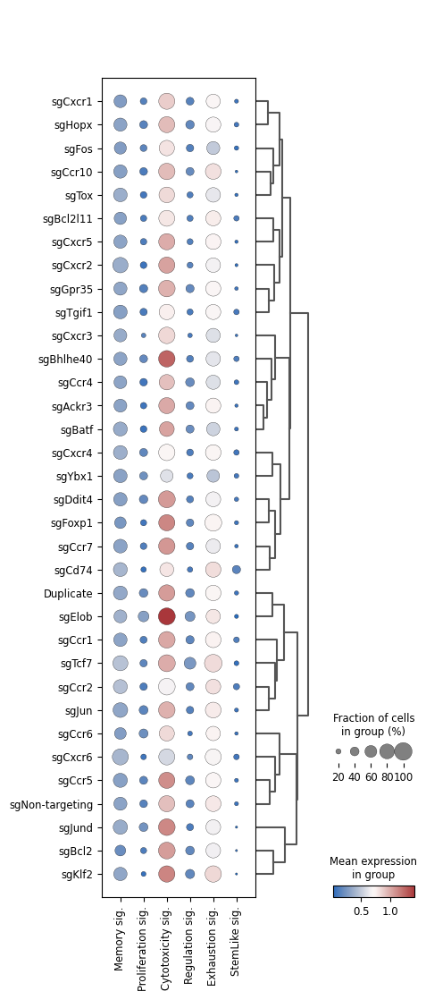

In [83]:
sc.pl.dotplot(scdata, var_names=['Memory sig.','Proliferation sig.','Cytotoxicity sig.','Regulation sig.','Exhaustion sig.','StemLike sig.'],groupby='perturb_gene',cmap='vlag',dendrogram=True)

# Clean guides

In [9]:
singlet_data = recluster_data[recluster_data.obs["perturb_gene"] != "Duplicate"].copy()

# Correlation

In [2]:
scdata = sc.read_h5ad("./RNA/sc.reclustered.h5")

In [4]:
sc.pp.highly_variable_genes(scdata, n_top_genes=1000)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


In [7]:
import numpy as np
gene_matrix = scdata[:, scdata.var.highly_variable].X.toarray()
# Standardize the matrix
gene_matrix = (gene_matrix - gene_matrix.mean(axis=0)) / gene_matrix.std(axis=0)
# Calculate correlation matrix using matrix multiplication
corr_matrix = np.corrcoef(gene_matrix.T)

In [36]:
from sklearn.cluster import AgglomerativeClustering, KMeans
from consensusclustering import ConsensusClustering

# clustering_obj = AgglomerativeClustering(metric='euclidean', linkage='ward')
clustering_obj = KMeans()
cc = ConsensusClustering(
    clustering_obj=clustering_obj,
    min_clusters=2,
    max_clusters=20,
    n_resamples=100,
    resample_frac=0.5,
    k_param='n_clusters'
)
cc.fit(corr_matrix, progress_bar=True)

Computing consensus matrices:   0%|          | 0/19 [00:00<?, ?it/s]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


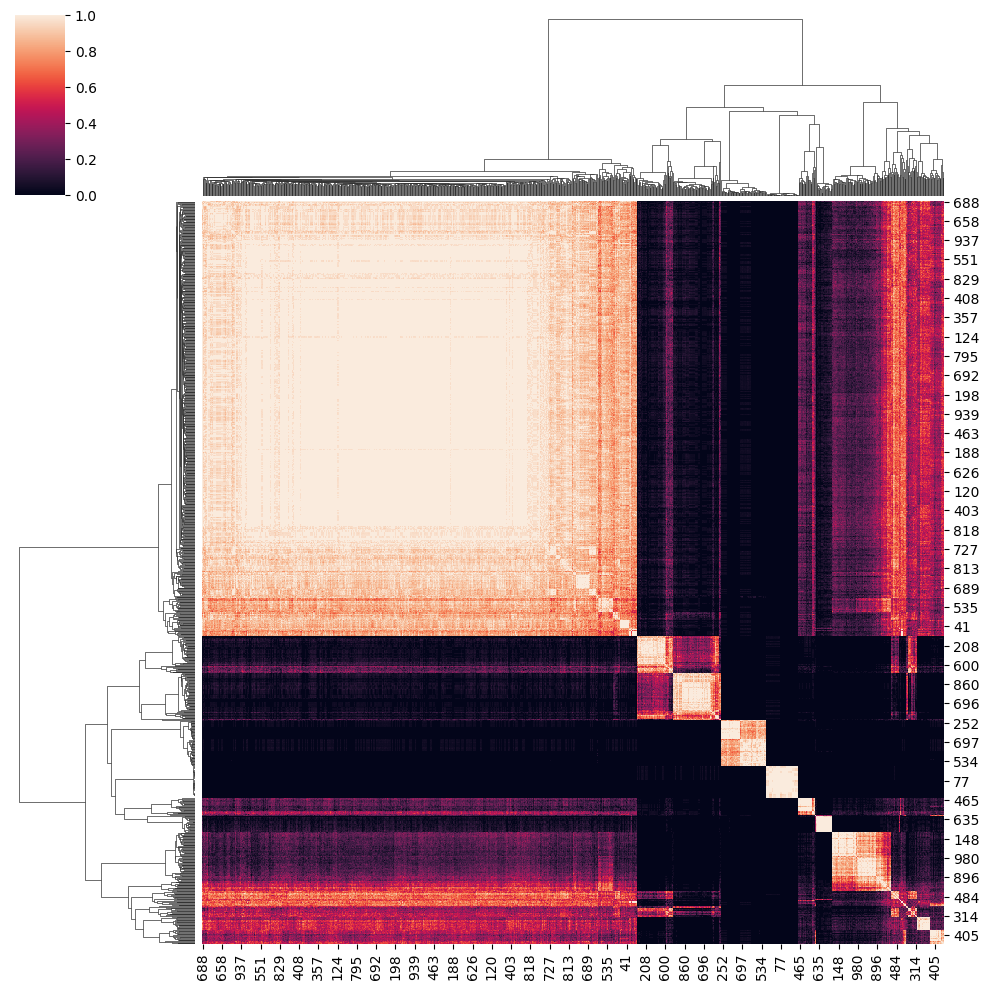

In [42]:
fig = cc.plot_clustermap(k=cc.best_k())

In [90]:
pd.DataFrame({
    'index': fig.dendrogram_row.reordered_ind,
    'gene': scdata[:, scdata.var.highly_variable].var_names[fig.dendrogram_row.reordered_ind]
}).to_csv("./sc.gene_program.names.csv", index=True)

In [91]:
np.save("./sc.gene_program.corr.npy", corr_matrix)

In [3]:
import numpy as np
corr_matrix = np.load("./sc.gene_program.corr.npy")

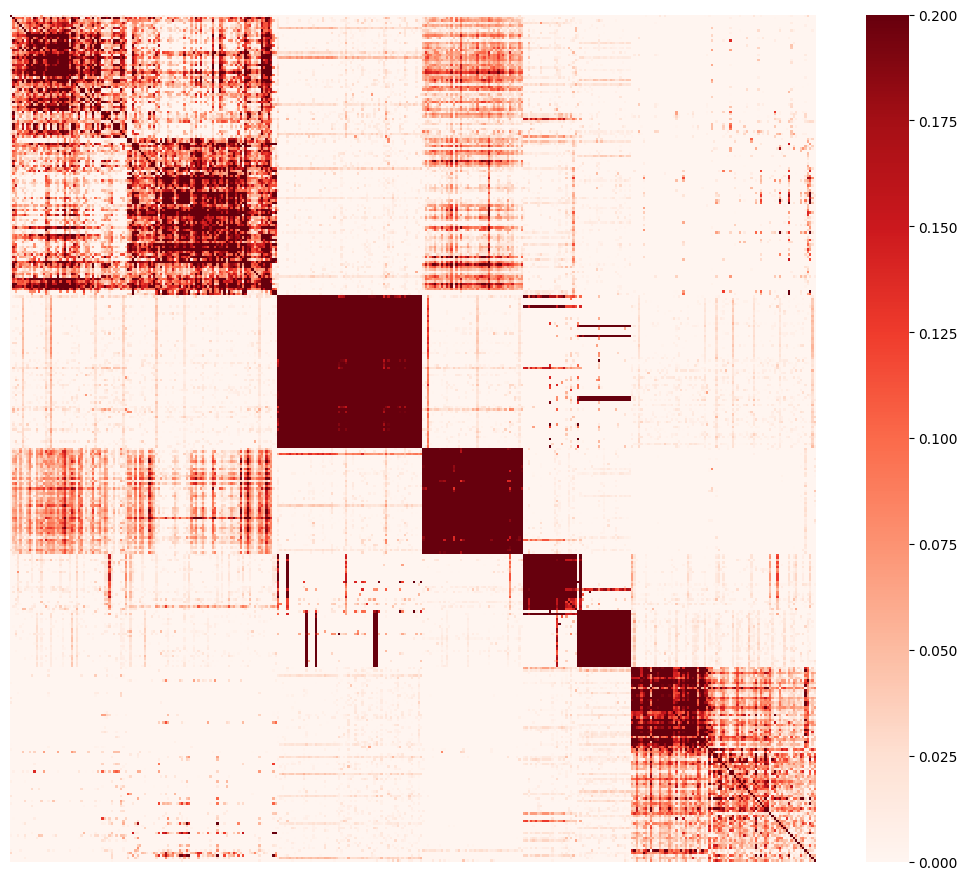

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
names_df = pd.read_csv("./sc.gene_program.names.csv", index_col=0)

kept_index = np.array(names_df['index'][565:][20:][:-71])

plt.figure(figsize=(13, 11))
sns.heatmap(corr_matrix[kept_index, :][:, kept_index],
            vmax=0.2, vmin=0, cmap="Reds")
# plt.xticks(list(range(len(kept_index))), kept_index, rotation=90, fontsize=5)
plt.xticks([])
plt.yticks([])
# plt.yticks(list(range(len(names_df['index'][565:]))), names_df['gene'][565:], rotation=0)

plt.rcParams['pdf.fonttype'] = 42
plt.savefig("./plots/sc.gene_program.heatmap.pdf", bbox_inches='tight')
plt.show()

In [54]:
# define programs
program_dict = {
    '1': names_df['gene'][565:][20:][:-71][:115].tolist(),
    '2': names_df['gene'][565:][20:][:-71][115:176].tolist(),
    '3': names_df['gene'][565:][20:][:-71][176:219].tolist(),
    '4': names_df['gene'][565:][20:][:-71][219:244].tolist(),
    '5': names_df['gene'][565:][20:][:-71][244:265].tolist(),
    '6': names_df['gene'][565:][20:][:-71][265:].tolist()
}

In [60]:
go_df = pd.DataFrame(columns=['Gene', 'Cluster'])
for i in range(6):
    go_df = pd.concat([go_df, pd.DataFrame({'Gene': program_dict[str(i+1)], 'Cluster': [i] * len(program_dict[str(i+1)])})])
# go_df
go_df.to_csv("../20240502-SPACseq/DEG.csv", index=False, sep='\t')

In [61]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene       object
Cluster     int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 1748
Enrichment analysis for list 1 completed successfully: 902
Enrichment analysis for list 2 completed successfully: 513
Enrichment analysis for list 3 completed successfully: 442
Enrichment analysis for list 4 completed successfully: 525
Enrichment analysis for list 5 completed successfully: 1039



In [62]:
for i in range(6):
    enr = pd.read_csv(f"../20240502-SPACseq/GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Adjusted P-value"] < 0.05]
    results = results.loc[:, ["Term", "Genes", "Adjusted P-value"]]
    results["Cluster"] = i
    results["Gene Counts"] = results["Genes"].str.split(";").apply(len)
    results["Term"] = results["Term"].str.split("R-HSA").str[0]
    results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
go_df

/tmp/ipykernel_106564/4138384896.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
/tmp/ipykernel_106564/4138384896.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).res

,Term,Genes,Adjusted P-value,Cluster,Gene Counts
0,Cytokine-cytokine receptor interaction,CSF2;TNFSF14;CD70;IL1R2;IFNG;IL23A;TNFSF4;IL2R...,1.886164e-09,0,16
1,TNFs Bind Their Physiological Receptors,TNFSF14;CD70;TNFSF4;TNFSF11;TNFSF9;TNFRSF4,3.558473e-06,0,6
2,Cytokine Signaling In Immune System,DUSP4;CDKN1A;CSF2;TNFSF14;CD70;IL1R2;STAT3;NFK...,3.558473e-06,0,19
3,Rheumatoid arthritis,H2-EB1;CSF2;IFNG;IL23A;CCL3;TNFSF11;H2-AB1,4.427913e-05,0,7
4,Hematopoietic cell lineage,H2-EB1;CSF2;CD8A;IL1R2;IL2RA;CD9;H2-AB1,6.241737e-05,0,7
...,...,...,...,...,...
75,Negative Regulation Of Lymphocyte Activation (...,LGALS3;PAG1,4.613587e-02,5,2
76,Regulation Of Nuclear-Transcribed mRNA Catabol...,ZFP36;ZFP36L1,4.613587e-02,5,2
77,Regulation Of Interleukin-4 Production (GO:003...,CD86;CEBPB,4.613587e-02,5,2
78,Neutrophil Migration (GO:1990266),LGALS3;CXCL10;JAML,4.613587e-02,5,3


In [74]:
go_df[go_df["Cluster"] == 5].head(40)

,Term,Genes,Adjusted P-value,Cluster,Gene Counts
0,Interferon Alpha/Beta Signaling,IFITM3;IFITM1;RSAD2;MX1;ISG15;IFIT1;USP18;IFIT...,3.711117e-18,5,14
1,Defense Response To Virus (GO:0051607),IFITM3;RTP4;IFITM1;RSAD2;MX1;ISG15;IFIT1;DDX60...,6.503198e-16,5,17
2,Defense Response To Symbiont (GO:0140546),IFITM3;RTP4;IFITM1;RSAD2;MX1;ISG15;IFIT1;DDX60...,7.011776e-15,5,15
3,Interferon Signaling,IFITM3;IFITM1;RSAD2;MX1;ISG15;IFIT1;USP18;IFIT...,4.959300e-12,5,14
4,Cytokine Signaling In Immune System,CD86;IFITM3;IFITM1;ANXA1;RSAD2;MX1;ISG15;IFIT1...,1.719361e-11,5,21
5,Negative Regulation Of Viral Process (GO:0048525),IFITM3;BST2;ISG20;IFITM1;ZFP36;RSAD2;MX1;ISG15...,5.281139e-10,5,9
6,Immune System,CD86;IFITM3;IFITM1;IFIT1;USP18;IFIT3;IFIT2;SOC...,9.085203e-10,5,30
7,Negative Regulation Of Viral Genome Replicatio...,IFITM3;BST2;ISG20;IFITM1;RSAD2;MX1;ISG15;IFIT1,5.826676e-09,5,8
8,Regulation Of Viral Genome Replication (GO:004...,IFITM3;BST2;ISG20;IFITM1;RSAD2;MX1;ISG15;IFIT1,3.281811e-08,5,8
9,Response To Cytokine (GO:0034097),BST2;IFITM3;IFITM1;ANXA1;MX1;BCL2;CXCR4;ISG15;...,1.902210e-07,5,9


/tmp/ipykernel_106564/4036071272.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipykernel_106564/4036071272.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipykernel_106564/4036071272.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipykernel_106564/4036071272.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(
/tmp/ipy

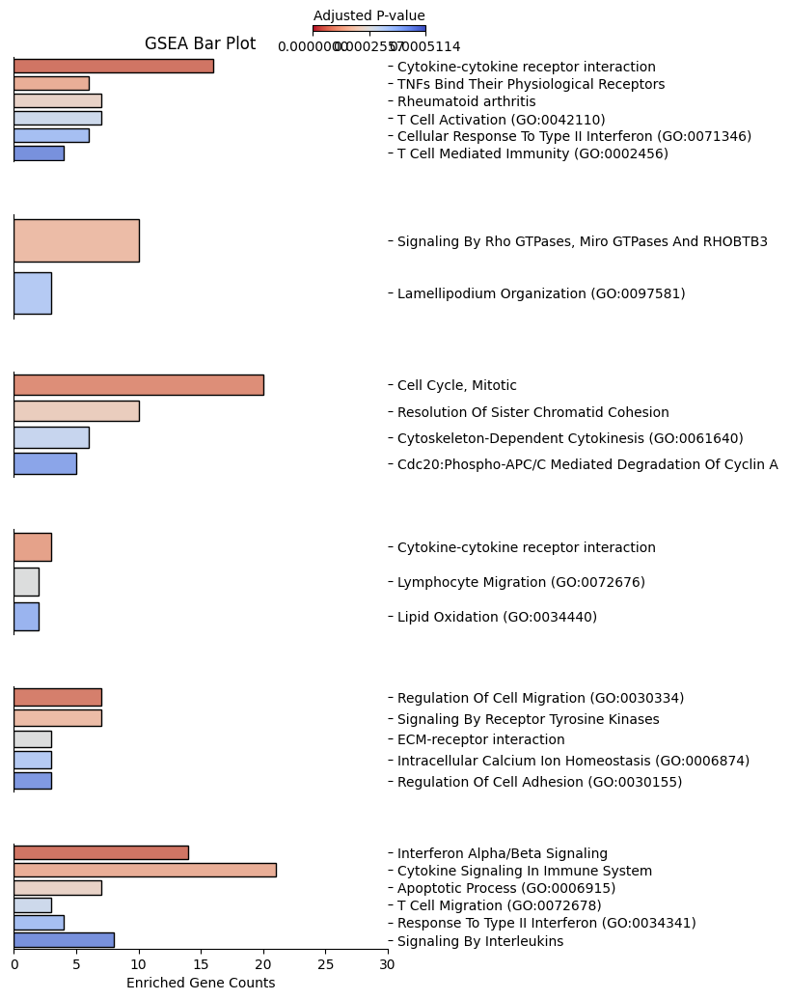

In [75]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(6, 1, figsize=(5, 12))
for cluster in range(6):
    if cluster == 0:
        gsea_results = go_df[go_df["Cluster"] == cluster].iloc[[0, 1, 3, 10, 13, 18], :]
    elif cluster == 1:
        gsea_results = go_df[go_df["Cluster"] == cluster].iloc[[0, 5], :]
    elif cluster == 2:
        gsea_results = go_df[go_df["Cluster"] == cluster].iloc[[0, 5, 18, 24], :]
    elif cluster == 3:
        gsea_results = go_df[go_df["Cluster"] == cluster].iloc[[16, 9, 4], :]
    elif cluster == 4:
        gsea_results = go_df[go_df["Cluster"] == cluster].iloc[[1, 3, 8, 38, 39], :]
    else:
        gsea_results = go_df[go_df["Cluster"] == cluster].iloc[[0, 4, 15, 17, 29, 35], :]

    barplot = sns.barplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results, 
        palette="coolwarm_r",
        edgecolor='black',
        ax=ax[cluster]
    )
    # for tick in ax[cluster].get_xticks():
        # ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5)

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm)
    sm.set_array([])
    if cluster == 0:
        cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                         bbox_to_anchor=(0.1, 0.3, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)

        cbar = fig.colorbar(sm, cax=cax, label="Adjusted P-value", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    # else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.1)

        cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=3)  # Adjust num for density
        cbar.set_ticks(cbar_ticks)
        cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

    # ax[cluster].set_xscale('log')
    ax[cluster].yaxis.tick_right()
    ax[cluster].set_ylabel('')

    ax[cluster].set_xlabel('')
    # ax[cluster].set_ylabel(f'Cluster {cluster}')
    ax[cluster].set_xlim(0, 30)

    if cluster != 5:
        ax[cluster].set_xticks([])
        sns.despine(ax=ax[cluster], left=False, bottom=True)
    else:
        sns.despine(ax=ax[cluster], left=False, bottom=False)


plt.subplots_adjust(hspace=0.5)
ax[0].set_title('GSEA Bar Plot')
ax[5].set_xlabel('Enriched Gene Counts')

plt.rcParams['pdf.fonttype'] = 42
plt.savefig('./plots/sc.gene_program.gsea.pdf', dpi=300, format='pdf')
plt.show()

In [85]:
for i in range(6):
    # sc.tl.score_genes(scdata, gene_list=program_dict[str(i+1)], score_name=f"program_{i+1}_score")
    scdata.obs[f"program_{i+1}_score"] = scdata[:, program_dict[str(i+1)]].X.toarray().mean(axis=1)

In [88]:
score_df = scdata.obs[['program_1_score', 'program_2_score', 'program_3_score', 'program_4_score', 'program_5_score', 'program_6_score', 'perturb_gene']]
score_df = score_df[score_df['perturb_gene'] != 'Duplicate']
score_df = score_df.groupby('perturb_gene').mean().dropna()
for col in score_df.columns:
    score_df[col] = (score_df[col] - score_df[col].min()) / (score_df[col].max() - score_df[col].min())

# 使用K-means对扰动基因进行聚类
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# 标准化数据
scaler = StandardScaler()
score_df_scaled = scaler.fit_transform(score_df)

# 使用肘部法则确定最佳K值
inertias = []
K = range(1, 10)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(score_df_scaled)
    inertias.append(kmeans.inertia_)

# 绘制肘部曲线
plt.figure(figsize=(8, 6))
plt.plot(K, inertias, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

# 根据肘部曲线选择合适的K值进行聚类
optimal_k = 3  # 根据肘部曲线选择最佳K值
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(score_df_scaled)

# 将聚类结果添加到原始数据框中
score_df['Cluster'] = clusters

# 可视化聚类结果
plt.figure(figsize=(12, 8))
for i in range(optimal_k):
    cluster_data = score_df[score_df['Cluster'] == i]
    plt.scatter(cluster_data['program_1_score'], 
               cluster_data['program_2_score'],
               label=f'Cluster {i}')
plt.xlabel('Program 1 Score')
plt.ylabel('Program 2 Score') 
plt.title('K-means Clustering of Perturb Genes')
plt.legend()
plt.show()

print("聚类结果:")
print(score_df.groupby('Cluster').size())


/tmp/ipykernel_106564/3314129322.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  score_df = score_df.groupby('perturb_gene').mean().dropna()


,program_1_score,program_2_score,program_3_score,program_4_score,program_5_score,program_6_score
perturb_gene,,,,,,
sgAckr3,0.229563,0.180868,0.081546,0.261702,0.000000,0.559515
sgBatf,0.000000,0.383840,0.000000,0.000000,0.000000,0.803287
sgBcl2,0.399241,1.000000,0.454350,0.159129,0.000000,0.344630
sgBcl2l11,0.404845,0.353680,0.283334,0.392656,0.227588,0.062052
sgBhlhe40,0.207189,0.152646,0.585824,0.351054,0.368830,0.501092
sgCcr1,0.561023,0.441808,0.483596,0.087455,0.000000,0.060173
sgCcr2,0.836959,0.000000,0.251283,0.103202,0.000000,0.024003
sgCcr4,0.404581,0.267758,0.087578,0.472916,0.000000,0.475409
sgCcr5,0.433635,0.147247,0.599376,0.084269,0.000000,0.177217


In [105]:
names_df[565:].to_csv("./sc.gene_program.names.sub.csv", index=True)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


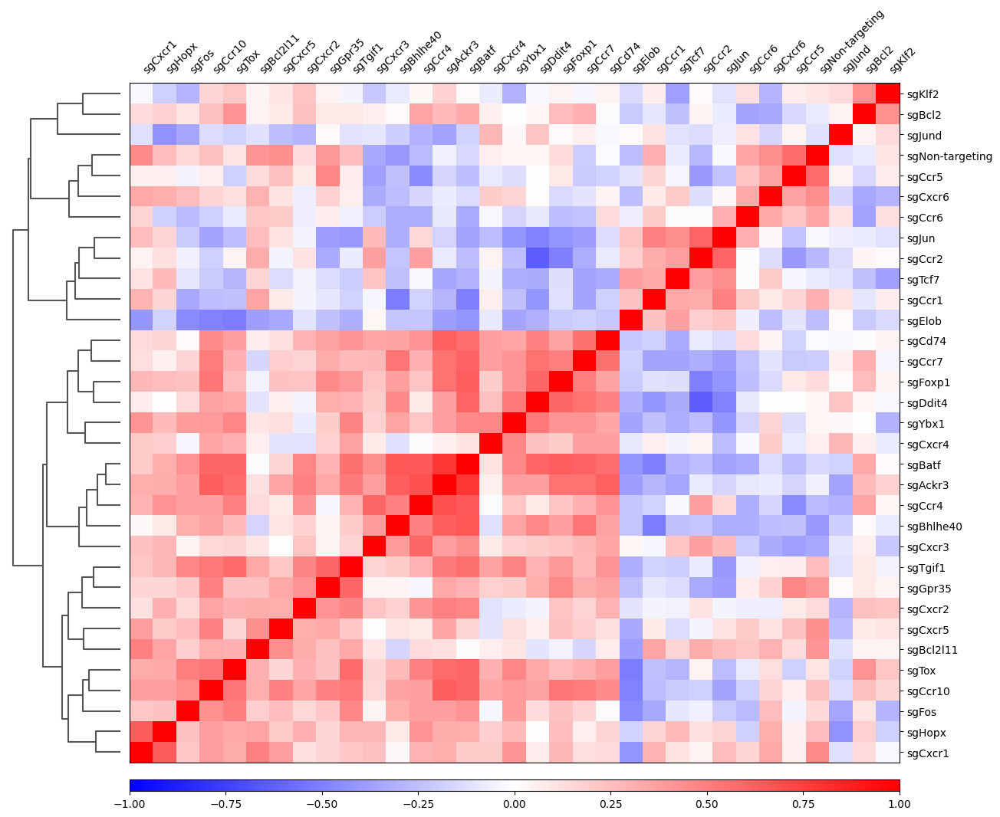

In [49]:
#fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax = sc.pl.correlation_matrix(singlet_data, 'perturb_gene', figsize=(15,12), vcenter=0)
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


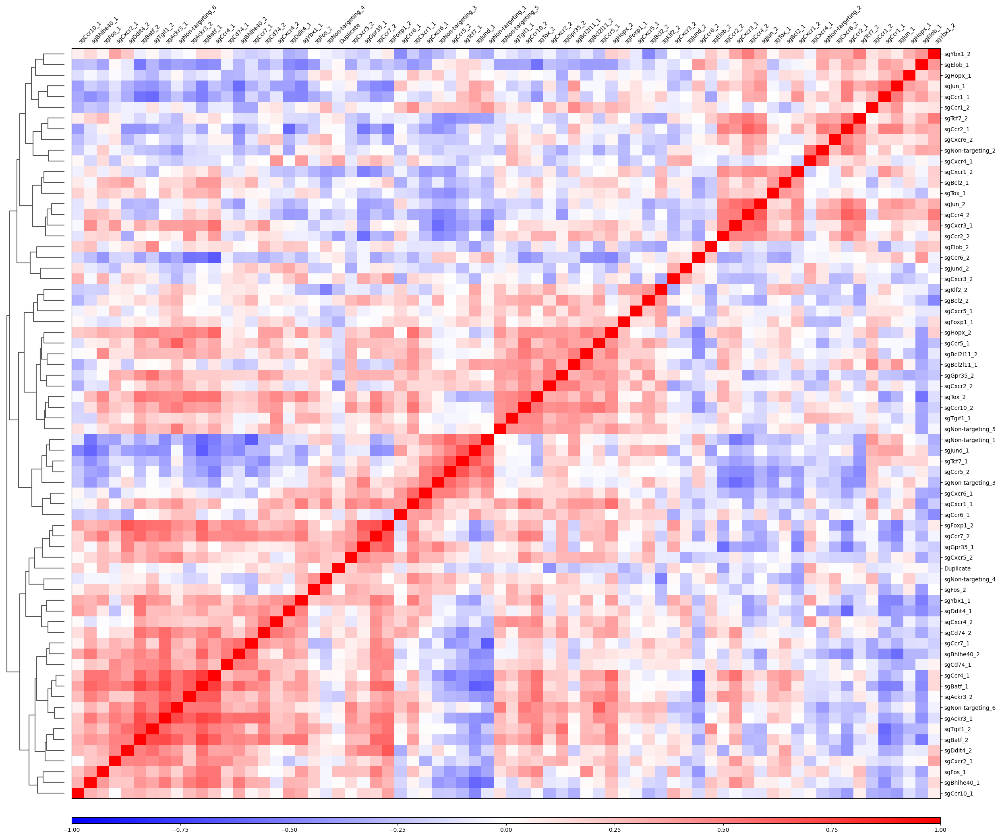

In [50]:
ax = sc.pl.correlation_matrix(singlet_data, 'perturb', figsize=(30,25), vcenter=0)

# map

In [12]:
singlet_data.write_h5ad('./RNA/sc.combined.dedup.clustered.h5')

In [48]:
sc.tl.embedding_density(cleandata, basis='umap', groupby='perturb_gene')

ValueError: Could not find 'perturb_gene' `.obs` column.

In [73]:
sc.tl.embedding_density(singlet_data, basis='umap', groupby='perturb_gene')

multi_tag \
    --mapfile ./RNA/sc.exclusive.mapfile.txt\
    --barcode_fasta ./RNA/exclusive.barcodes.b646.fa(/home/zhanghr/seq/SPAC-seq/sc/Perturb\ seq跑cellranger质检/B646/filtered_feature_bc_matrix/barcodes.tsv.gz)\
    --split_matrix\
    --minimum_length 10\
    --lowNum 3\
    --mod shell

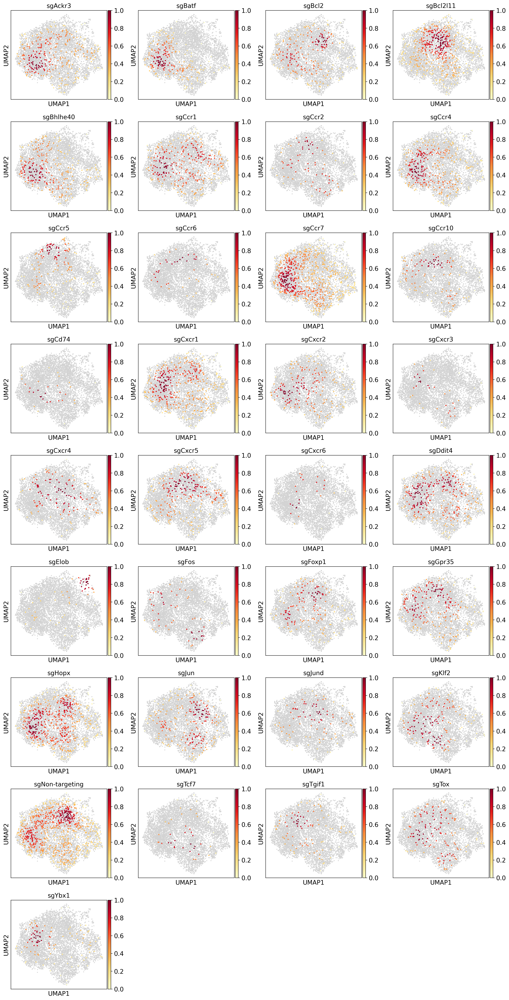

In [79]:
sc.pl.embedding_density(singlet_data, basis='umap', key='umap_density_perturb_gene', fg_dotsize=30, bg_dotsize=20)

In [266]:
cleandata.var_names[cleandata.var_names.str.startswith('Selp')]

Index(['Selp', 'Selplg'], dtype='object')

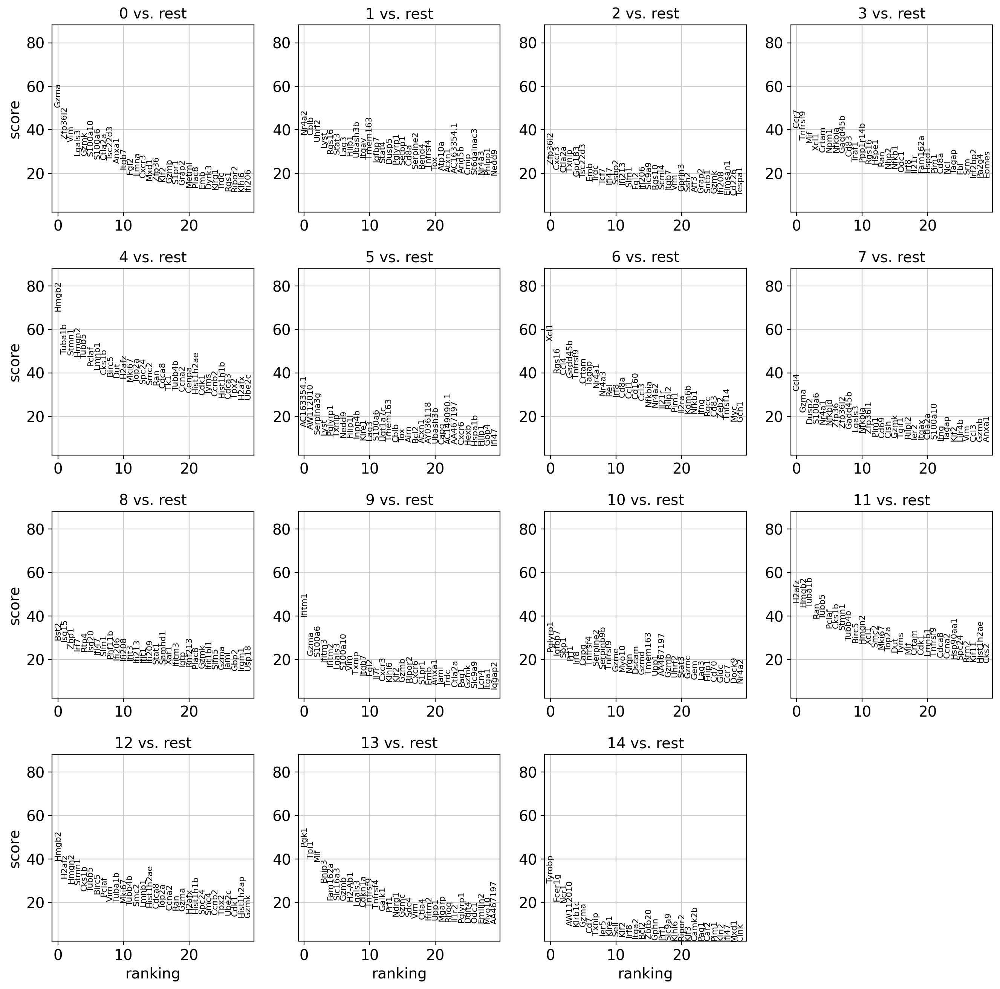

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


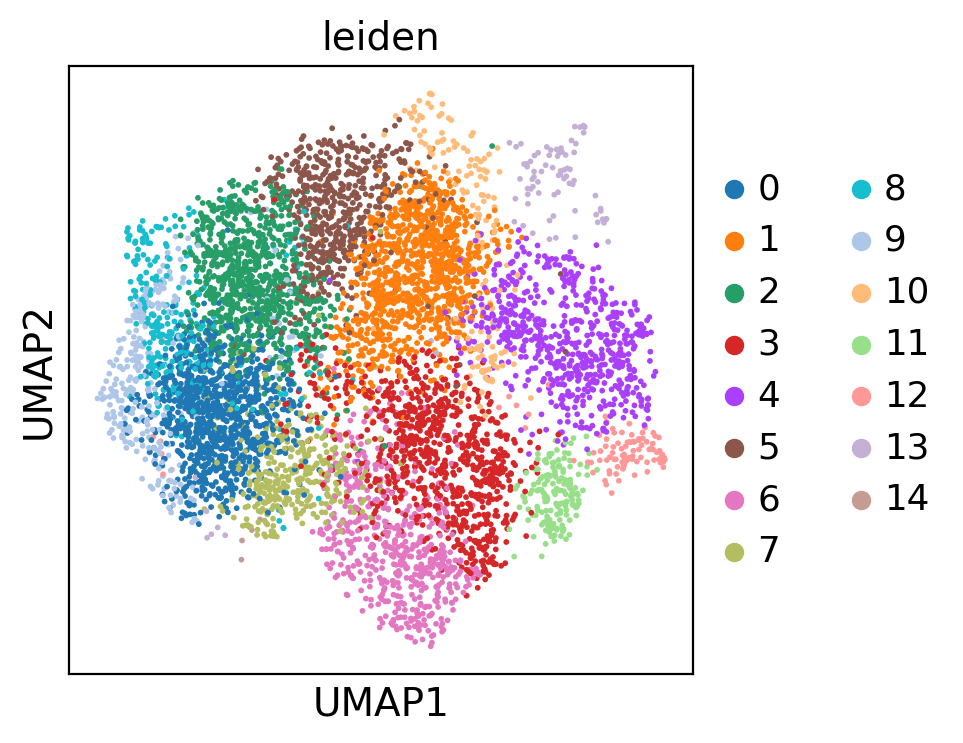

In [80]:
sc.tl.rank_genes_groups(recluster_data, groupby='leiden', method='t-test')
sc.pl.rank_genes_groups(recluster_data, n_genes=30)
sc.pl.umap(singlet_data, color="leiden")

In [11]:
# cluster_map = {
#     '0': 'Cxcr3+ Effector Cd8+ T',
#     '1': 'Cxcr3+ Stem-like Cd8+ T',
#     '2': 'Stat3+/Stat4+ Exhausted Cd8+ T',
#     '3': 'Ccr7+ Central Memory Cd8+ T',
#     '4': 'Poliferating Cd8+ T',
#     '5': 'Ccl4+/Ccl3+ Effector Cd8+ T',
#     '6': 'NK Cd8+ T',
#     '7': 'Exhausted Cd8+ T',
#     '8': 'Cxcr3+ Effector Cd8+ T',
#     '9': 'Irf7+ Effector Cd8+ T',
#     '10': 'Poliferating Cd8+ T',
#     '11': 'Prf1 Effector Cd8+ T',
#     '12': 'Poliferating Cd8+ T',
#     '13': 'Exhausted Cd8+ T',
# }
cluster_map = {
    '0': 'Effector Cd8+ T',
    '1': 'Stem-like Cd8+ T',
    '2': 'Exhausted Memory Cd8+ T',
    '3': 'Central Memory Cd8+ T',
    '4': 'Poliferating Cd8+ T',
    '5': 'Exhausted Cd8+ T',
    '6': 'Effector Memory Cd8+ T',
    '7': 'Exhausted Cd8+ T',
    '8': 'Effector Cd8+ T',
    '9': 'Effector Cd8+ T',
    '10': 'Poliferating Cd8+ T',
    '11': 'Effector Cd8+ T',
    '12': 'Poliferating Cd8+ T',
    '13': 'Exhausted Cd8+ T',
}
singlet_data.obs.leiden = singlet_data.obs.leiden.map(cluster_map)
singlet_data.obs.leiden

AAACCTGAGAGACGAA-1            Effector Cd8+ T
AAACCTGAGCTTATCG-1            Effector Cd8+ T
AAACCTGAGTACTTGC-1    Exhausted Memory Cd8+ T
AAACCTGAGTATCGAA-1           Stem-like Cd8+ T
AAACCTGCACGACGAA-1           Stem-like Cd8+ T
                               ...           
TTTGTCACATTGCGGC-1            Effector Cd8+ T
TTTGTCAGTAAAGGAG-1            Effector Cd8+ T
TTTGTCAGTCGCCATG-1            Effector Cd8+ T
TTTGTCATCCGTCATC-1        Poliferating Cd8+ T
TTTGTCATCCTTTCTC-1            Effector Cd8+ T
Name: leiden, Length: 6935, dtype: object

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. 

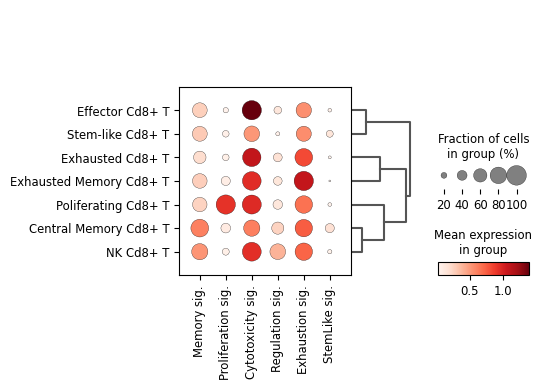

In [91]:
singlet_data.obs['Proliferation sig.']=np.mean(singlet_data.to_df().loc[: ,Proliferation_sig],axis=1)
singlet_data.obs['Cytotoxicity sig.']=np.mean(singlet_data.to_df().loc[: ,Cytotoxicity_sig],axis=1)
singlet_data.obs['Exhaustion sig.']=np.mean(singlet_data.to_df().loc[: ,Exhaustion_sig],axis=1)
singlet_data.obs['Memory sig.']=np.mean(singlet_data.to_df().loc[: ,Memory_sig],axis=1)
singlet_data.obs['Regulation sig.']=np.mean(singlet_data.to_df().loc[: ,Regulation_sig],axis=1)
singlet_data.obs['StemLike sig.']=np.mean(singlet_data.to_df().loc[: ,StemLike_sig],axis=1)
sc.pl.dotplot(singlet_data,var_names=['Memory sig.','Proliferation sig.','Cytotoxicity sig.','Regulation sig.','Exhaustion sig.','StemLike sig.'],groupby='leiden',dendrogram=True)

# sankey plot

In [3]:
from matplotlib.sankey import Sankey

In [13]:
cleandata = sc.read_h5ad("./RNA/sc.combined.h5")

In [14]:
cleandata.var_names[cleandata.var_names.str.startswith("Xist")]

Index(['Xist'], dtype='object')

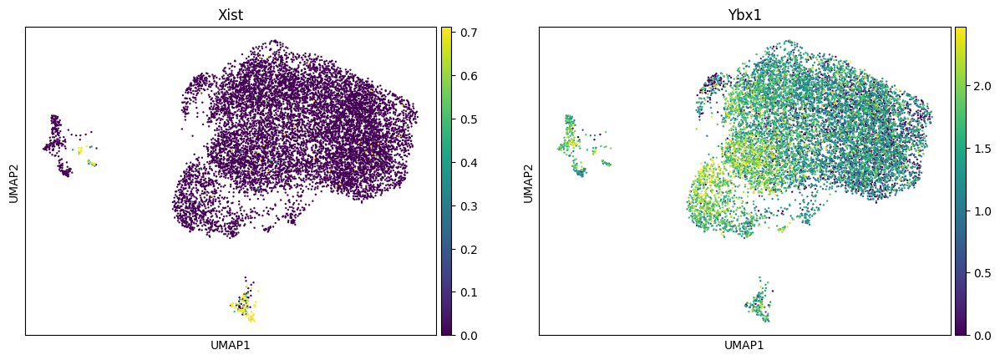

In [17]:
sc.pl.umap(cleandata, color=["Xist", "Ybx1"], vmax='p99')

In [4]:
def plot_sankey(data, labels=None, title=None):
    sankey = Sankey()
    flows = data['flows']
    orientations = data['orientations']
    labels = labels if labels else data['labels']

    for flow, orientation, label in zip(flows, orientations, labels):
        sankey.add(flows=flow, labels=label, orientations=orientation)

    fig, ax = plt.subplots()
    sankey.finish()
    if title:
        ax.set_title(title)
    plt.show()

In [9]:
singlet_data.obs["leiden"] = singlet_data.obs["leiden"].map(lambda x: "Effector Memory Cd8+ T" if x == "NK Cd8+ T" else x).astype("category").tolist()
singlet_data.obs["leiden"]

AAACCTGAGAGACGAA-1            Effector Cd8+ T
AAACCTGAGTACTTGC-1           Stem-like Cd8+ T
AAACCTGCACGACGAA-1           Exhausted Cd8+ T
AAACGGGAGATGTGTA-1    Exhausted Memory Cd8+ T
AAACGGGTCTCTAAGG-1     Effector Memory Cd8+ T
                               ...           
TTTGCGCCATCACCCT-1           Stem-like Cd8+ T
TTTGCGCTCCTACAGA-1            Effector Cd8+ T
TTTGGTTGTAGCGCTC-1            Effector Cd8+ T
TTTGGTTGTTACTGAC-1            Effector Cd8+ T
TTTGTCAGTAAAGGAG-1            Effector Cd8+ T
Name: leiden, Length: 2424, dtype: object

In [10]:
import plotly.graph_objects as go

# 示例数据
data = singlet_data.obs[["perturb_gene", "leiden"]]
data.columns = ["perturb_gene", "cluster"]

df = pd.DataFrame(data)

# 计算流量值（在这里，每个组合的频率）
flows = df.groupby(['perturb_gene', 'cluster']).size().reset_index(name='count')

# 创建源、目标和值的列表
source_indices = []
target_indices = []
values = []

# 获取唯一的perturb_gene和cluster
unique_genes = flows['perturb_gene'].unique()
unique_clusters = flows['cluster'].unique()

# 创建索引映射
gene_indices = {gene: idx for idx, gene in enumerate(unique_genes)}
cluster_indices = {cluster: idx + len(unique_genes) for idx, cluster in enumerate(unique_clusters)}

# 构建源、目标和值列表
for index, row in flows.iterrows():
    source_indices.append(gene_indices[row['perturb_gene']])
    target_indices.append(cluster_indices[row['cluster']])
    values.append(row['count'])

# 计算每个perturb_gene的流量总和
total_flows_per_gene = flows.groupby('perturb_gene')['count'].sum()

# 计算每个perturb_gene的流量占比
flows['total_gene_flow'] = flows['perturb_gene'].map(total_flows_per_gene)
flows['color_intensity'] = flows['count'] / flows['total_gene_flow']

# 创建颜色映射
import matplotlib.cm as cm
colors = [cm.RdBu_r(2.5*x) for x in flows['color_intensity']]
    
# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_genes) + list(unique_clusters),
        color="Orange"
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=[f"rgba({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)}, 0.7)" for color in colors],
    )
)])

# 更新布局
fig.update_layout(title_text="Sankey Diagram of perturb_gene to cluster", font_size=10)
fig.update_layout(
    width=600,  # 设置宽度
    height=1200,  # 设置高度
)
fig.show()

/tmp/ipykernel_33170/1205853567.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_33170/1205853567.py:32: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [2]:
singlet_data = sc.read_h5ad("./RNA/sc.combined.clustered.h5")

In [11]:
singlet_data.write_h5ad("./RNA/sc.combined.clustered.h5")